In [242]:
using RobustAndOptimalControl
using ControlSystemsBase 
using Plots

In [243]:
function parse_tf_from_file(fname)

    file = open(fname, "r")
    lines = readlines(file)
    close(file)

    # join to one String
    lines = join(lines)
    num = split(lines, "]")[1]
    num = replace(num, "[" => "")

    den = split(lines, "]")[2]
    den = replace(den, "[" => "")
    den = replace(den, "]" => "")


    num_f = []
    for fs in split(num, " ")
        if fs == ""
            continue
        end
        push!(num_f, parse(Float64, fs))
    end

    den_f = []
    for fs in split(den, " ")
        if fs == ""
            continue
        end
        push!(den_f, parse(Float64, fs))
    end

    num_f = Vector{Float64}(num_f)
    den_f = Vector{Float64}(den_f)


    G = tf(num_f, den_f)
    G = minreal(G)
    return G
end

parse_tf_from_file (generic function with 1 method)

# Plant

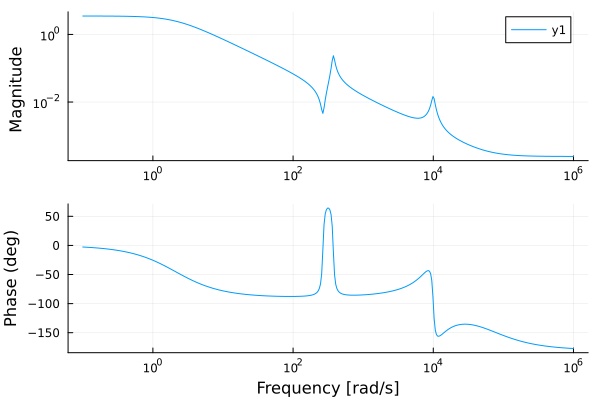

In [244]:
s = tf("s")
G = parse_tf_from_file("tf_txt/Gf.txt")

bodeplot(G)

In [245]:
function pt2(w0,d)
    s = tf("s")
    return w0^2/(s^2 + 2*d*w0*s + w0^2)
end

pt2 (generic function with 1 method)

# Uncertainty

TransferFunction{Continuous, ControlSystemsBase.SisoRational{Float64}}
3.136e6s^3 + 4.659667214155539e9s^2 + 1.5308912798542036e12s + 8.995202158979427e13
-----------------------------------------------------------------------------------
78400.0s^3 + 6.387322389753073e9s^2 + 1.0770039598785161e12s + 4.997334532766409e14

Continuous-time transfer function model

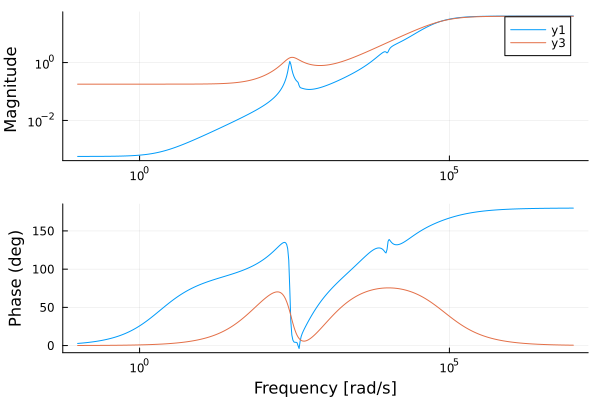

In [246]:

W1 = 0.1
W2 = pt2(250,0.1)/pt2(250,0.8)
W3 = (s/3000 + 1)^2/(s/(5*1e5) + 1)^2
W_delta = W1*W2*W3


ROB_SCALE = 1 # Increase for more robustness
W_delta = makeweight(0.18, 2000, 40) |> tf
#W_delta = W_delta* pt2(280,0.2)/(pt2(280,2)) * ROB_SCALE
W_delta = W_delta* pt2(280,0.3)/(pt2(280,2)) * ROB_SCALE
W_delta0 = parse_tf_from_file("tf_txt/W_delta.txt")

print(W_delta)

bodeplot([W_delta0,W_delta])



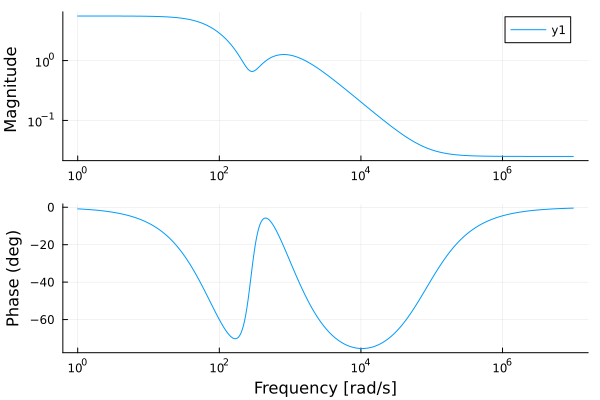

In [247]:
bodeplot(1/W_delta)

# Control limit

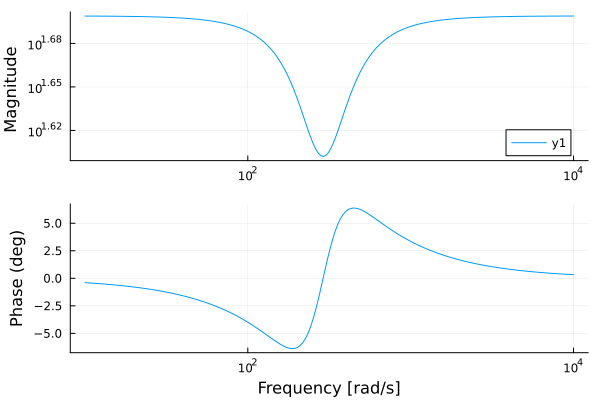

In [248]:


# Max Torque, and Nyquist freq as dynamic limit
#w_nyq = 2*pi/(125*1e-6)
#print(w_nyq)
max_T = 50

WU = tf(1)*max_T
WU = WU * pt2(290,0.5)/(pt2(290,0.4))

bodeplot(WU)

In [249]:
WU = 1/WU

TransferFunction{Continuous, ControlSystemsBase.SisoRational{Float64}}
 84100.0s^2 + 2.4389e7s + 7.07281e9
------------------------------------
4.205e6s^2 + 9.7556e8s + 3.536405e11

Continuous-time transfer function model

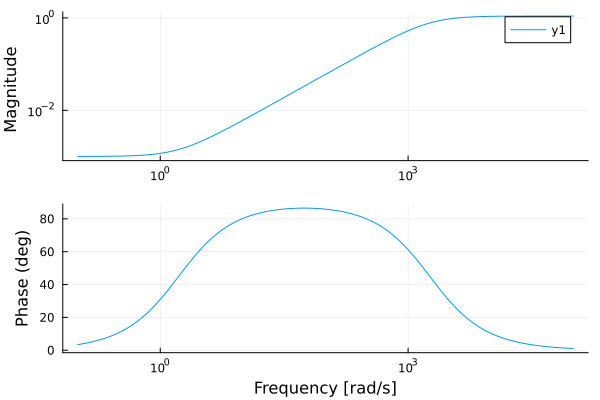

In [250]:
# Desired closed loop bw rad/s
omega_cl = 4000

WS = 1/makeweight(1e-3, omega_cl, 1.1) |> tf

bodeplot([1/WS])


In [251]:

WT = W_delta

P = hinfpartition(G, WS, WU, WT)
hinfassumptions(P)



All assumtions are satisfied!


true

4.209143996063399

┌ Warning: Numerical problems encountered, returned γ is adjusted to the γ achieved by the computed controller (γ - γactual = 0.06894222289896934). Try solving the problem in higher precision by calling hinfsynthesize(...; ftype=BigFloat)
└ @ RobustAndOptimalControl C:\Users\Elias\.julia\packages\RobustAndOptimalControl\Qj5nj\src\hinfinity_design.jl:203


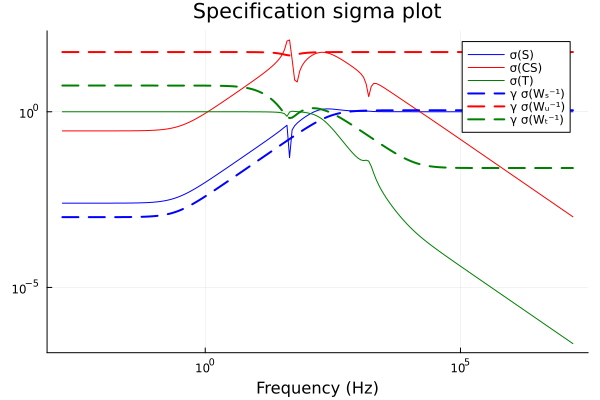

In [252]:
K, y = hinfsynthesize(P, γrel=1.05)

K = minreal(K)

print(y)



Pcl, S, KS, T = hinfsignals(P, G, K)


specificationplot([S,K*S,T], [WS,WU,WT],wint=(-2,8))


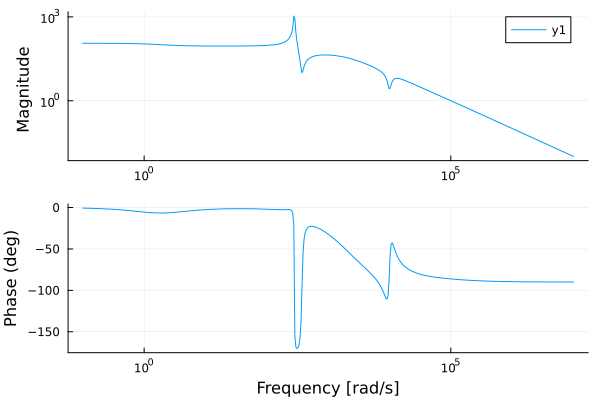

In [253]:
bodeplot(K)

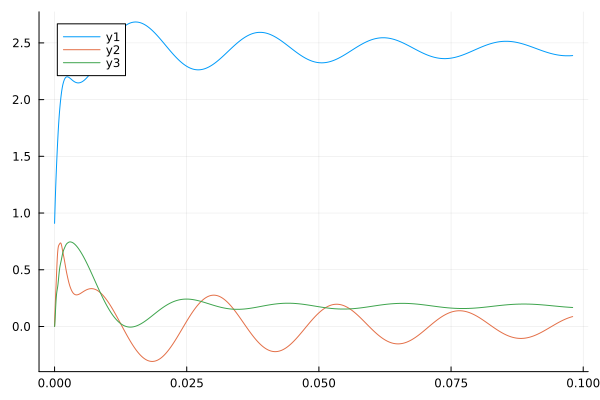

In [254]:
y, t = step(Pcl);
plot(t, y')

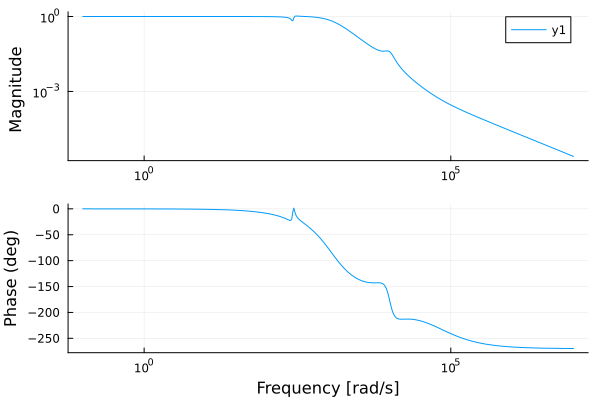

In [255]:

Pcl = G*K/(1 + G*K)

Pcl = minreal(Pcl)

bodeplot(Pcl)

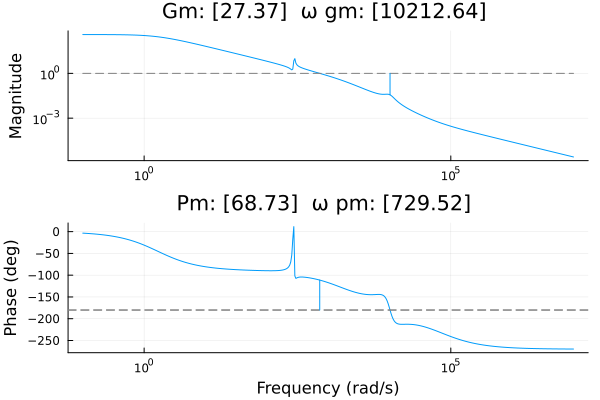

In [256]:
L = minreal(G*K)
marginplot(L)

In [257]:
K = tf(K)

num = K.matrix[1,1].num.coeffs
den = K.matrix[1,1].den.coeffs

fpath = "tf_txt/K_hinf.txt"
open(fpath, "w") do file
    write(file, string(num))
    write(file, "\n")
    write(file, string(den))
end

K

TransferFunction{Continuous, ControlSystemsBase.SisoRational{Float64}}
     102506.63114250216s^10 + 8.480969353620151e9s^9 + 2.2272986907642797e13s^8 + 8.44454502852821e17s^7 + 3.681474940994348e20s^6 + 2.9753393163813626e23s^5 + 8.004265515643064e25s^4 + 3.006577655993903e28s^3 + 4.0151968572079884e30s^2 + 7.766892411583262e32s + 1.61175938930039e33
-----------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------
1.0s^11 + 90817.66672279214s^10 + 6.162937321865038e8s^9 + 9.711262869475357e12s^8 + 1.975772870893475e16s^7 + 9.146886199116625e18s^6 + 5.137697921341833e21s^5 + 1.2610641681398932e24s^4 + 3.912466722156356e26s^3 + 4.727400079443272e28s^2 + 8.569943325225912e30s + 1.4151412338540132e31

Continuous-time transfer function model